---
title: From harmonic oscillator to the parametron
subtitle: We try to understand the Kerr Parametric Oscillator (KPO) by slowly adding complexity the harmonic oscillator.
summary: Learn how to blog in Academic using Jupyter notebooks
authors:
- admin
tags: []
categories: []
date: "2022-11-02T00:00:00Z"
lastMod: "2023-05-19T00:00:00Z"
featured: false
draft: false
private: false

reading_time: true  # Show estimated reading time?
share: false  # Show social sharing links?
profile: true  # Show author profile?
comments: false  # Show comments?

# Featured image
# To use, add an image named `featured.jpg/png` to your page's folder. 
image:
  preview_only: true
  caption: ""
  focal_point: ""

# Projects (optional).
#   Associate this post with one or more of your projects.
#   Simply enter your project's folder or file name without extension.
#   E.g. `projects = ["internal-project"]` references 
#   `content/project/deep-learning/index.md`.
#   Otherwise, set `projects = []`.
projects: []
---

In this notebook, we try to understand the parametron, also known as Kerr Parametric Oscillator (KPO). We will begin with a system we already understand very well and build up are knowledge by slowly encreasing the complexity of the system.

The sources used in the endeavour are:

* T. Heugel, Parametrons: From Sensing to Optimization Machines, Doctoral thesis at ETH Zürich, 2022.
* J. Košata, J. del Pino, T. Heugel, and O. Zilberberg, HarmonicBalance.Jl: A Julia Suite for Nonlinear Dynamics Using Harmonic Balance, SciPost Phys. Codebases 6 (2022).
* O. Zilberberg and A. Eichler, Classical and Quantum Parametric Phenomena (2022).
* J. Košata, Spatial and Temporal Mode Engineering in Nonlinear Media, Doctoral thesis at ETH Zürich, 2022.

To run this notebook the following julia environment was used:

In [117]:
using DrWatson
versioninfo()

Julia Version 1.9.0
Commit 8e63055292 (2023-05-07 11:25 UTC)
Platform Info:
  OS: Windows (x86_64-w64-mingw32)
  CPU: 12 × AMD Ryzen 5 5600X 6-Core Processor             
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, znver3)
  Threads: 10 on 12 virtual cores
Environment:
  JULIA_NUM_THREADS = 10


And the following packages are needed:

In [118]:
using HarmonicBalance, OrdinaryDiffEq, ModelingToolkit
HB_settings = (:threading => true, :show_progress => false)

using Plots, LaTeXStrings, Latexify, Measures
import Base.@kwdef
default(fontfamily="computer modern", titlefont="computer modern", tickfont="computer modern",
        legend = :best, linewidth = 2, show = true, fmt = :svg)
plot_size = (750, 350); margin = 5mm;

using Pkg; 
Pkg.status(
    ["HarmonicBalance", "OrdinaryDiffEq", "ModelingToolkit", "Plots",
    "Latexify", "DrWatson", "LaTeXStrings", "Measures"]
)

Status `C:\Users\orjan\.julia\environments\v1.9\Project.toml`
  [634d3b9d] DrWatson v2.12.5
  [e13b9ff6] HarmonicBalance v0.6.4
  [b964fa9f] LaTeXStrings v1.3.0
⌅ [23fbe1c1] Latexify v0.15.21
  [442fdcdd] Measures v0.3.2
⌃ [961ee093] ModelingToolkit v8.46.1
  [1dea7af3] OrdinaryDiffEq v6.51.2
  [91a5bcdd] Plots v1.38.12
Info Packages marked with ⌃ and ⌅ have new versions available, but those with ⌅ are restricted by compatibility constraints from upgrading. To see why use `status --outdated`


## Harmonic Oscillator


We begin with the simple harmonic oscillator and slowly build up to the *parametron*. We make use of the differential equation solver of Julia to analyse the system.

In [119]:
@variables t x(t) # symbolic variables
@parameters ω ω₀ F γ
Dₜ = Differential(t)
@named sys = ODESystem([Dₜ(Dₜ(x)) ~ - ω₀^2*x - γ*Dₜ(x) + F*cos(ω*t)], t, [x], [ω₀, ω, F, γ])
sys = ode_order_lowering(sys)

Model sys with 2 equations
States (2):
  xˍt(t)
  x(t)
Parameters (4):
  ω₀
  ω
  F
  γ

### Simple Harmonic Oscillator


Let us first plot the resonator without any damping ($\gamma=0$) or external drive ($F=0$):

In [120]:
x0 = [x => 1.0, Dₜ(x) => 0]; tspan = (0.0, 200.0)
fixed = [ω₀ => 1.0, γ => 0.0, F => 0.0, ω => 0.0]

4-element Vector{Pair{Num, Float64}}:
 ω₀ => 1.0
  γ => 0.0
  F => 0.0
  ω => 0.0

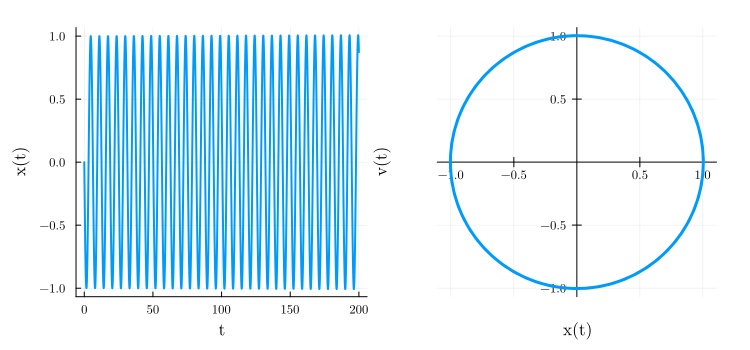

In [121]:
prob = ODEProblem(sys, x0, tspan, fixed)
tr = solve(prob, Tsit5(), saveat=0.1);

plot1 = plot(tr.t , tr[1,:], xlabel="t", ylabel="x(t)", legend=false, rightmargin=0mm)
plot2 = plot(tr, idxs=(1,2), xlabel="x(t)", ylabel="v(t)", legend=false, framestyle = :origin,
             aspect_ratio=1, leftmargin=0mm)
plot(plot1, plot2, size = plot_size, margin = margin, legend=false)

In general, it is useful the look at the system in phase space. Note, the path is periodic.

### Damping
One can add *damping* to make it make realistic ($\gamma > 0$). In general, we have three regimes:
$$
\begin{cases}
    \omega_0 > \gamma/2 \quad \text{(underdamped)} \\
    \omega_0 = \gamma/2 \quad \text{(citically damped)} \\
    \omega_0 < \gamma/2 \quad \text{(overdamped)}\\
\end{cases}
\qquad  \underbrace{\quad\Longrightarrow\quad}_{\gamma = \omega_0/Q} \qquad
\begin{cases}
    Q > 1/2 \quad \text{(underdamped)} \\
    Q = 1/2 \quad \text{(citically damped)} \\
    Q < 1/2  \quad \text{(overdamped)}\\
\end{cases}
$$
$Q$ is called the *quality factor* which characterizes the damping.

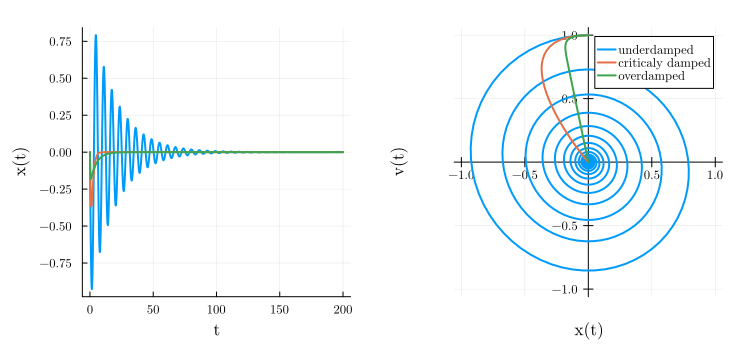

In [122]:
u0 = [x => 1.0, Dₜ(x) => 0]; tspan = (0.0, 200.0);
p1 = [ω₀ => 1.0, γ => 0.1, F => 0.0,  ω => 1.0]
p2 = [ω₀ => 1.0, γ => 2.0, F => 0.0,  ω => 1.0]
p3 = [ω₀ => 1.0, γ => 5.0, F => 0.0,  ω => 1.0]
prob =  [ODEProblem(sys, u0, tspan, p) for p in [p1, p2, p3]]
tr = [solve(p, Tsit5(), saveat=0.1) for p in prob];

plot1 = plot(;xlabel="t", ylabel="x(t)", legend=false)
plot2 = plot(;xlabel="x(t)", ylabel="v(t)", framestyle = :origin, aspect_ratio=1)
for (sol, lab) in zip(tr, ["underdamped", "criticaly damped", "overdamped"])
    plot!(plot1, sol.t , sol[1,:])
    plot!(plot2, sol, idxs=(1,2), lims = :symmetric, label = lab)
end
plot(plot1, plot2, size = plot_size, margin = margin)

We observe a *ringdown process*, i.e., exponential weakening of the oscillation amplitude.

### Damped driven harmonic oscillator


Let us make the harmonic oscillator complete by adding *external driving* ($F>0$) with frequency $\omega$.

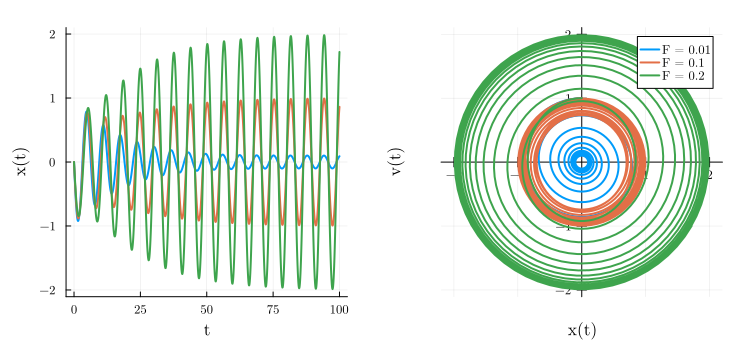

In [123]:
u0 = [x => 1.0, Dₜ(x) => 0]; tspan = (0.0, 100);
p1 = [ω₀ => 1.0, γ => 0.1, F => 0.01,  ω => 1.0]
p2 = [ω₀ => 1.0, γ => 0.1, F => 0.1,  ω => 1.0]
p3 = [ω₀ => 1.0, γ => 0.1, F => 0.2,  ω => 1.0]
prob =  [ODEProblem(sys, u0, tspan, p) for p in [p1, p2, p3]]
tr = [solve(p, Tsit5(), saveat=0.1) for p in prob];

plot1 = plot(;xlabel="t", ylabel="x(t)", legend=false)
plot2 = plot(;xlabel="x(t)", ylabel="v(t)", framestyle = :origin, aspect_ratio=:equal)
for (sol, lab) in zip(tr, ["F = 0.01", "F = 0.1", "F = 0.2"])
    plot!(plot1, sol.t , sol[1,:])
    plot!(plot2, sol, idxs=(1,2), lims = :symmetric, label = lab)
end
plot(plot1, plot2, size = plot_size, margin = margin)

The amplitude of the steady state oscillation depends on $F$, as expected.

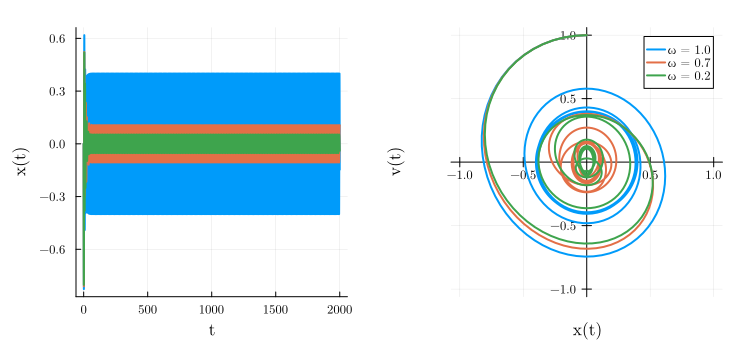

In [124]:
u0 = [x => 1.0, Dₜ(x) => 0]; tspan = (0.0, 2000);
p1 = [ω₀ => 1.0, γ => 0.2, F => 0.08,  ω => 1.0]
p2 = [ω₀ => 1.0, γ => 0.2, F => 0.08,  ω => 0.7]
p3 = [ω₀ => 1.0, γ => 0.2, F => 0.08,  ω => 0.5]
prob =  [ODEProblem(sys, u0, tspan, p) for p in [p1, p2, p3]]
tr = [solve(p, Tsit5(), saveat=0.1) for p in prob];

plot1 = plot(;xlabel="t", ylabel="x(t)", legend=false)
plot2 = plot(;xlabel="x(t)", ylabel="v(t)", framestyle = :origin, aspect_ratio=1)
for (sol, lab) in zip(tr, ["ω = 1.0", "ω = 0.7", "ω = 0.2"])
    plot!(plot1, sol.t , sol[1,:])
    plot!(plot2, sol, idxs=(1,2), lims = :symmetric, label = lab)
end

plot(plot1, plot2, size = plot_size, margin = margin)

But also on the detuning, i.e., $|\omega_0-\omega|$, of the natural frequency $\omega_0$ and driving frequency $\omega$.

### Frequency sweep and harmonic reponse

The harmonic oscillator has only one frequency response, in particular that of the drive $\omega_d$. Indeed:
$$
\ddot{x}(t)+\gamma\dot{x}(t)+\omega_0^2x=F\cos(\omega_d t + \theta) \quad  \underbrace{\quad\Longrightarrow\quad}_{\text{Fourier w.r.t. $\omega$}} \quad
\tilde{x}(\omega) = \frac{F}{\omega_0^2-\omega^2+i\omega\gamma}\left[\delta(\omega+\omega_d)+\delta(\omega-\omega_d)\right]
$$
Let us look at the steady state. For this we use *Harmonic Balance method*. Clearly, in the long-time limit, our system will behave as a harmonic, i.e., we use the ansatz $x(t)=A\cos(\omega t + \phi)$. Hence, we can write:
$$
x(t) = A \cos(\phi) \cos(\omega t) - A \sin(\phi) \sin(\omega t) = u(A, \phi)\cos(\omega t) + v(A, \phi)  \sin(\omega t)
$$
where we used some the sum-to-product [trigonometric identities](https://en.wikipedia.org/wiki/List_of_trigonometric_identities#Product-to-sum_and_sum-to-product_identities) and defined [quadratures](https://en.wikipedia.org/wiki/Optical_phase_space) $u$ and $v$. From, know one we examine our system in terms of the quadratures, i.e., in the ***rotating frame***.

Clearly, for the whole time evolution the amplitude $A$ and phase $\phi$ will not be constants. Hence, in general, we say that the quadratures depend on the slow time $T$, where the $\cos$ and $\sin$ are dependent on fast time $t$.

In [125]:
@parameters ω ω₀ F γ λ θ α ψ η
natural_equation = d(d(x, t), t) + γ*d(x, t) + ω₀^2*(1-λ*cos(2*ω*t + ψ))*x + α*x^3 + η*d(x, t)*x^2
forces = F*cos(ω*t + θ)
diff_eq = DifferentialEquation(natural_equation ~ forces, x)

add_harmonic!(diff_eq, x, ω);
harmonic = get_harmonic_equations(diff_eq);

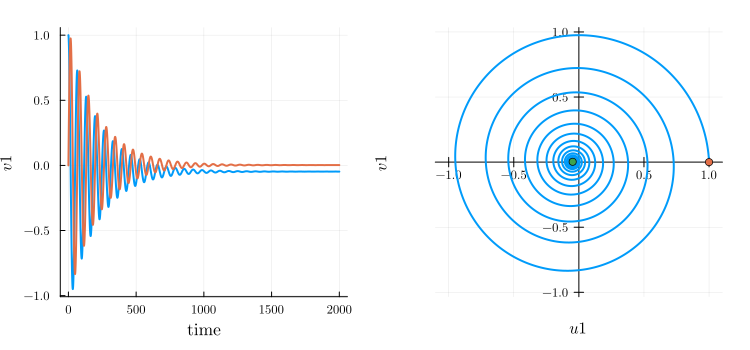

In [126]:
x0 = [1.0, 0.0]; tspan = (0.0, 2000.0)
fixed = (ω => 1.1, ω₀ => 1.0, γ => 0.01, F => 0.01, α => 0.0, λ => 0.0, η => 0.0, θ => 0.0, ψ => 0.0)

ode_problem = ODEProblem(harmonic, fixed, x0 = x0, timespan = tspan)
tr = solve(ode_problem, Tsit5(), saveat=0.1);

p1 = plot(tr, "u1", harmonic, size = plot_size)
plot!(tr, "v1", harmonic)
p2 = plot(tr, ["u1", "v1"], harmonic, framestyle=:origin, aspect_ratio=1, lims=:symmetric)
plot!([x0[1]],[x0[2]], markers=:true, line=false)
plot!([tr.u[end][1]],[tr.u[end][2]], markers=:true, line=false, size = plot_size, margin = margin)
plot(p1, p2)

Notice that one of the quadratures, $u_1$, is non-zero for large $t$, which means the system oscillates with frequency $\omega_0$.

In experiment, the system is often analysed with frequency sweeps, i.e., we look at the response of the oscillators when changing the external driving frequency adiabatically.

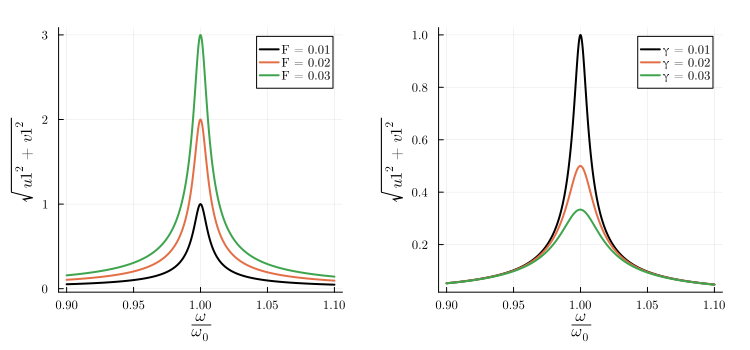

In [127]:
varied = ω => range(0.9, 1.1, 500);

listγ = pairs([0.01, 0.02, 0.03]);
results = Vector(undef, length(listγ))
plotγ = plot()
for (i,gamma) in listγ
    fixed = (ω₀ => 1.0, γ => gamma, F => 0.01, α => 0.0, λ => 0.0, η => 0.0, θ => 0.0, ψ => 0.0)
    results[i] = get_steady_states(harmonic, varied, fixed)
    plot!(results[i], x="ω/ω₀", y="sqrt(u1^2 + v1^2)", color = i == 1 ? :black : i, label="γ = $gamma")
end

listF = pairs([0.01, 0.02, 0.03])
results = Vector(undef, length(listF))
plotF = plot()
for (i,force) in listγ
    fixed = (ω₀ => 1.0, γ => 0.01, F => force, α => 0.0, λ => 0.0, η => 0.0, θ => 0.0, ψ => 0.0)
    results[i] = get_steady_states(harmonic, varied, fixed)
    plot!(results[i], x="ω/ω₀", y="sqrt(u1^2 + v1^2)", color = i == 1 ? :black : i, label="F = $force")
end
plot!(plotF, plotγ;legend = :best, size = plot_size, margin = margin)

The resonant peak has a Lorentzian shape, where the height is affected by $\gamma$ and $F$ and the peak maximum is at $\omega_d=\omega_0 \sqrt{1-\gamma^2 / 2 \omega_0^2}$, i.e., the peak shifts depending on $\gamma$.

## Duffing Oscillator


In [128]:
@variables t x(t) # symbolic variables
@parameters ω ω₀ F γ α
Dₜ = Differential(t)
eq = Dₜ(Dₜ(x)) ~ - ω₀^2*x - γ*Dₜ(x) -α*x^3 + F*cos(ω*t)
@named sys = ODESystem([eq], t, [x], [ω₀, ω, F, γ, α])
sys = ode_order_lowering(sys)

Model sys with 2 equations
States (2):
  xˍt(t)
  x(t)
Parameters (5):
  ω₀
  ω
  F
  γ
⋮

### Harmonics and bifurcations

The equation of motion for the displacement $x(t)$ reads
\begin{align*}
\underbrace{\ddot{x}(t)+\gamma \dot{x}(t)+\omega_0^2 x(t)}_{\text {damped harmonic oscillator }}+\underbrace{\alpha x(t)^3}_{\text {Duffing coefficient }}=\underbrace{F \cos (\omega t)}_{\text {periodic drive }}
\end{align*}
For $\alpha=0$, the system becomes linear and responds precisely at the drive frequency, so that $x(t)=X \cos (\omega t+\phi)$, where $X$ and $\phi$ can be found analytically. For $\alpha \neq 0$ this is no longer possible.
We can obtain some intuition by treating $\alpha$ perturbatively, i.e., by solving
\begin{align*}
\ddot{x}(t)+\gamma \dot{x}(t)+\omega_0^2 x(t)+\epsilon \alpha x(t)^3=F \cos (\omega t)
\end{align*}
for small $\epsilon$. To zeroth order, the response of the system is $x_0(t)=X_0 \cos \left(\omega t+\phi_0\right)$. Expanding $x(t)=x_0(t)+\epsilon x_1(t)$, we find that the perturbation $x_1(t)$ satisfies to first order
\begin{align*}
\ddot{x}_1(t)+\gamma \dot{x}_1(t)\left[\omega_0^2+\frac{3 \alpha X_0^2}{4}\right] x_1(t)=-\frac{\alpha X_0^3}{4} \cos \left(3 \omega t+3 \phi_0\right),
\end{align*}
which gives a response of the form $x_1(t)=X_1 \cos \left(3 \omega t+\phi_1\right)$. Clearly, the oscillator now responds not only at frequency $\omega$, but also at $3 \omega$ ! This effect is known as high harmonic generation or more generally frequency conversion. By continuing the procedure to higher orders, we eventually obtain an infinity of harmonics present in the response. In general, there is no analytical solution to such problems.


![spectrogram of the Duffing oscillator as a function of amplitude](./6L8FYzd.png)

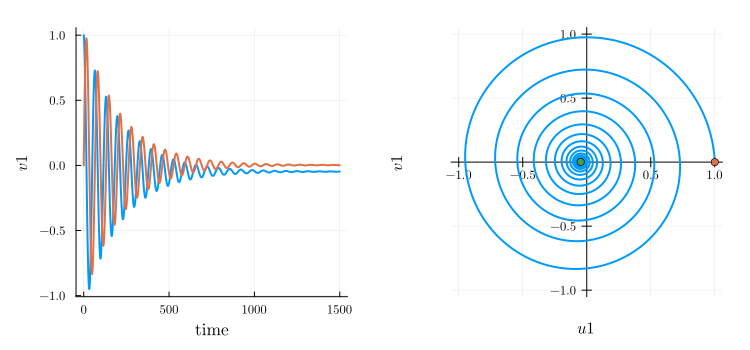

In [129]:
x0 = [1.0, 0.0]; tspan = (0.0, 1500.0)
fixed = (ω => 1.1, ω₀ => 1.0, γ => 0.01, F => 0.01, α => 0.0, λ => 0.0, η => 0.0, θ => 0.0, ψ => 0.0)

ode_problem = ODEProblem(harmonic, fixed, x0 = x0, timespan = tspan)
tr = solve(ode_problem, Tsit5(), saveat=0.1);

p1 = plot(tr, "u1", harmonic)
plot!(tr, "v1", harmonic)
p2 = plot(tr, ["u1","v1"], harmonic, legend=false, framestyle=:origin, aspect_ratio=1, lims=:symmetric)
plot!([x0[1]],[x0[2]], markers=:true, line=false)
plot!([tr.u[end][1]],[tr.u[end][2]], markers=:true, line=false)
plot(p1, p2, size = plot_size, margin = margin)

Although, at first sight looking at the response nothing changed much but when again performing frequency sweeps it becomes interesting.

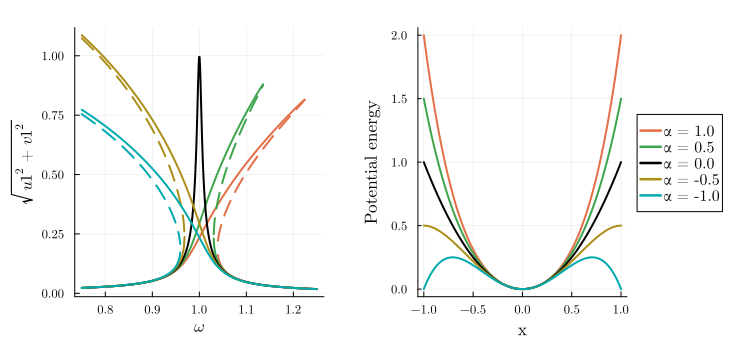

In [130]:
varied = ω => range(0.75, 1.25, 500)

listβ = pairs([1.0, 0.5, 0.0, -0.5, -1.0])
results = Vector(undef, length(listβ))
plot1 = plot(;legend = false)
for (i,beta) in listβ
    fixed = Dict(ω₀ => 1.0, γ => 0.01, F => 0.01, α => beta, λ => 1e-8, η => 1e-8, θ => 1e-8, ψ => 1e-8)
    results[i] = get_steady_states(harmonic, varied, fixed; HB_settings...)
    plot!(results[i], x="ω", y="sqrt(u1^2 + v1^2)", color = beta == 0.0 ? :black : i+1, legend=false)
end

displ = -1:0.01:1
plot2 = plot(legend= :outerright, ylabel = "Potential energy", xlabel = "x")
for (i,beta) in listβ
    pot = fixed[ω₀] .* displ.^2 + beta .* displ.^4
    plot!(displ, pot, color = beta == 0.0 ? :black : i+1, label = "α = $beta")
end

l = @layout [a{0.45w} b]
plot(plot1, plot2, layout = l, legendfontsize=10, size = plot_size, margin = margin)

* Depending on $\alpha$ the resonance frequency of the oscillator shifts.
* The larger the discrepancy of the driving frequency compared to the natural frequency (detuning), the larger the amplitude. Until it drops for really large detuning.
* The behaviour w.r.t. is asymmetric around the origin. For negative $\alpha$, we observe instability for high displacements.
* We have a bifurcation when changing $\alpha$ or $\omega$, where we go from one state (stable) to three state (two stable, one unstable). Where the initial condition decides in which branch we will end up.

### Instability for $x_0\approx \omega_0^2/\alpha_3$
Let us go to the complete time response picture again.

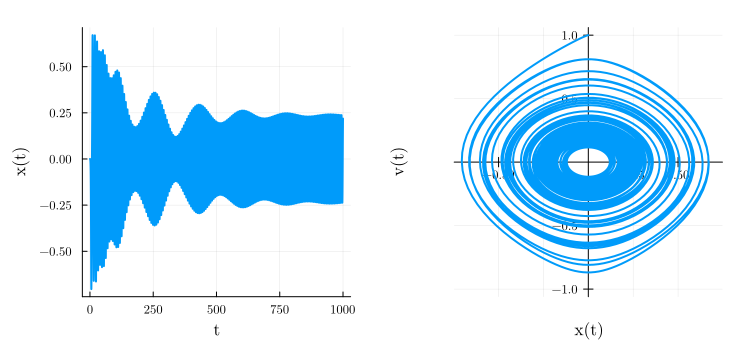

In [131]:
x0 = [x => 1.0, Dₜ(x) => 0.0]; tspan = (0.0, 1000.0)
p = [ω₀ => 1.0, γ => 0.01, F => 0.01,  ω => 1.0, α => -0.99]
prob = ODEProblem(sys, x0, tspan, p)
tr = solve(prob, Tsit5(), saveat=0.1);

plot1 = plot(tr.t, tr[1,:], xlabel="t", ylabel="x(t)", legend=false)
plot2 = plot(tr, idxs=(1,2), xlab="x(t)", ylab="v(t)", legend=false, frame=:origin, lims=:symmetric)
plot(plot1, plot2, size = plot_size, margin = margin)

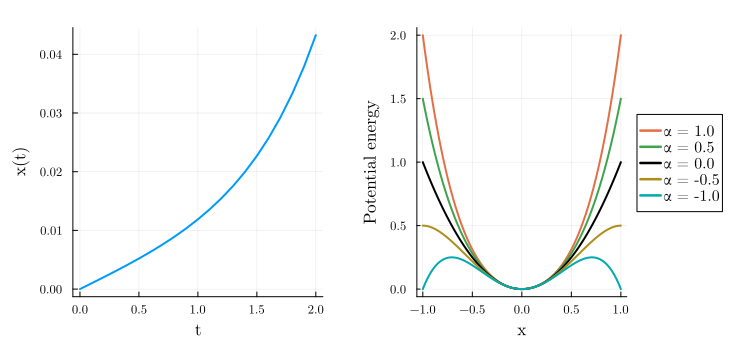

In [132]:
#| fig-align: center
x0 = [x => 1.0, Dₜ(x) => 0.0]; tspan = (0.0, 2.0)
p = [ω₀ => 1.0, γ => 0.01, F => 0.01,  ω => 1.0, α => -1.0]
prob = ODEProblem(sys, x0, tspan, p)
tr = solve(prob, Tsit5(), saveat=0.1);

plot1 = plot(tr.t , tr[1,:], xlabel="t", ylabel="x(t)", legend=false)

displ = -1:0.01:1
plot2 = plot(legend= :outerright, ylabel = "Potential energy", xlabel = "x")
for (i,beta) in listβ
    pot = fixed[ω₀] .* displ.^2 + beta .* displ.^4
    plot!(displ, pot, color = beta == 0.0 ? :black : i+1, label = "α = $beta")
end
plot(plot1, plot2, layout = l, legendfontsize=10, size = plot_size, margin = margin)

The system becomes unstable for $x_0\approx \omega_0^2/\alpha_3$. In general, we need that $x_0\ll \omega_0^2/\alpha_3$

### Hysteresis


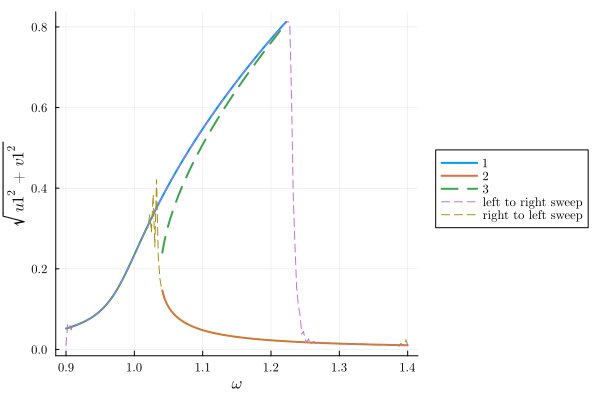

In [133]:
varied = ω => range(0.9, 1.4, 150)
fixed = Dict(ω₀ => 1.0, γ => 0.01, F => 0.01, α => 1.0, λ => 0.0, η => 0.0, θ => 0.0, ψ => 0.0)
result = get_steady_states(harmonic, varied, fixed; random_warmup=true, HB_settings...)
plot(result, "sqrt(u1^2+v1^2)")

# linearly interpolate between two values at two times
right_sweep = ParameterSweep(ω => (0.9, 1.4), (0.0, 2e4)) 
ode_problem_right = ODEProblem(harmonic, fixed, sweep=right_sweep, x0=[0.01;0.0], timespan=(0.0,2e4))

left_sweep = ParameterSweep(ω => (1.4, 0.9), (0.0, 2e4))
ode_problem_left = ODEProblem(harmonic, fixed, sweep=left_sweep, x0=[0.01;0.0], timespan=(0.0,2e4))

sol_right = solve(ode_problem_right, Tsit5(), saveat = 100);
amplitude_right = sqrt.(sol_right[1,:].^2 + sol_right[2,:].^2)
sol_left  = solve(ode_problem_left, Tsit5(), saveat = 100);
amplitude_left = sqrt.(sol_left[1,:].^2 + sol_left[2,:].^2)

plot!(right_sweep[ω].(sol_right.t), amplitude_right, style=:dash, label="left to right sweep", linewidth=1)
plot!(left_sweep[ω].(sol_left.t), amplitude_left,  style=:dash, label="right to left sweep", linewidth=1)

We observe *hysteresis*, i.e., the system takes different paths from high to low driving frequncy or visa versa.

## Paramatric modulation
Let us for a second assume nor driving or damping. We do introduce the periodic modulation of the natural frequency $\omega_0$ such that are e.o.m. becomes:

$$\ddot{x}(t)+\omega_0^2(1-\lambda\cos(2\omega t + \psi))x =0.$$


In [134]:
@variables t x(t) # symbolic variables
@parameters λ, ψ
Dₜ = Differential(t)
eq = Dₜ(Dₜ(x)) ~ - ω₀^2*(1-λ*cos(2*ω*t + ψ))*x - γ*Dₜ(x) + F*cos(ω*t)
@named sys = ODESystem([eq], t, [x], [ω₀, ω, F, γ, α, λ, ψ])
sys = ode_order_lowering(sys)

Model sys with 2 equations
States (2):
  xˍt(t)
  x(t)
Parameters (7):
  ω₀
  ω
  F
  γ
⋮

In the potential picture this effect changes the steepness of the harmonic potential periodically.

![](./3c0aX5R.png)

### Instability of the linear parametrically driven harmonic oscillator

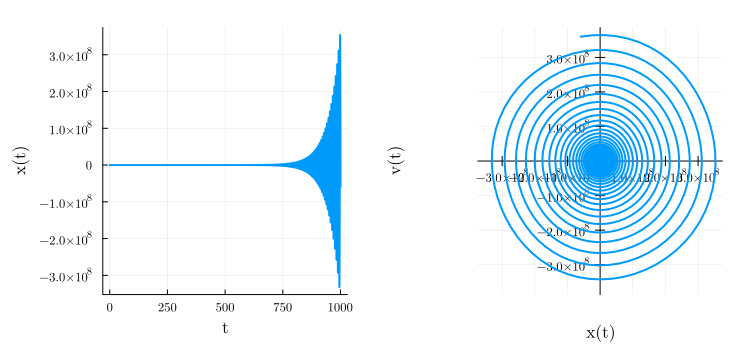

In [135]:
x0 = [x => 1.0, Dₜ(x) => 0.0]; tspan = (0.0, 1000.0)
fixed = [ω₀ => 1.0, γ => 0.01, F => 0.0, ω => 1.0, α => 0.0, λ => 0.1, ψ => 0.0]
prob = ODEProblem(sys, x0, tspan, fixed)
tr = solve(prob, Tsit5(), saveat=0.1);

plot1 = plot(tr.t , tr[1,:], xlabel="t", ylabel="x(t)", legend=false)
plot2 = plot(tr, idxs=(1,2), xlabel="x(t)", ylabel="v(t)", legend=false, framestyle = :origin, lims = :symmetric)
plot(plot1, plot2, size = plot_size, margin = margin)

For different detuning's $|\omega-\omega_0|$, we observe that the system becomes unstable or stable, where in the stable regions the steady states has always a zero amplitude. This corresponds with our intuition of the potential picture. Indeed, think about it.

![](./hB4IXHH.png)



Notice how there is a resonance not at one value for $\omega_p$, but for an infinite values of $\omega_p$, i.e. in multiples of $\omega$. This is in stark contract to normal external driving.

We cal the instability lobes *Arnold tongues*:
* They appear at $2\omega_0/\omega_p=n$ with $n\in \mathbb{N}$
* They broaden for increasing $\lambda$
* Linear dissipation $\gamma$ can only stabilize the system for small $\lambda$


The *parametric instability threshold*
$\lambda_{\text {th }}=2 \sqrt{(\Omega \bar{\gamma})^2+\left(1-\Omega^2\right)^2}$ with $\Omega = \omega/\omega_0$, is where the system becomes unstable in the first instability lobe.

### Parametric damping and amplification

Again thinking in the potential picture, the phase $\psi$ of the parametric drive becomes quiet important.

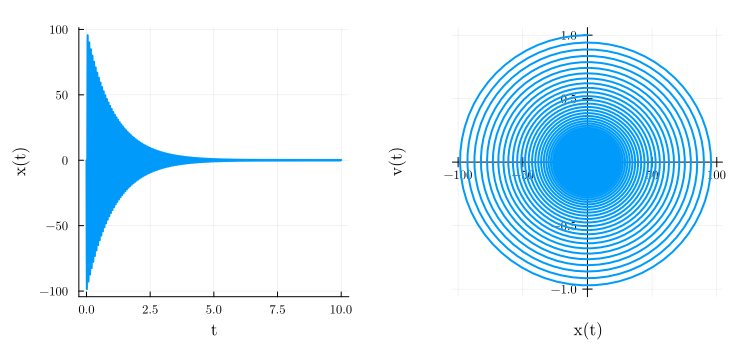

In [136]:
x0 = [x => 1.0, Dₜ(x) => 0.0]; tspan = (0.0, 10.0)
Q = 100
omega0 = 100
λₜₕ = 2/Q
fixed = [ω₀ => omega0, γ => ω₀/Q, F => 0.0, ω => omega0, α => 0.0, λ => 0.9*λₜₕ, ψ => -π/2]
prob = ODEProblem(sys, x0, tspan, fixed)
tr = solve(prob, Tsit5(), saveat=0.001);

plot1 = plot(tr.t , tr[1,:], xlabel="t", ylabel="x(t)", legend=false)
plot2 = plot(tr, idxs=(1,2), xlabel="x(t)", ylabel="v(t)", legend=false, framestyle = :origin, lims = :symmetric)
plot(plot1, plot2, size = plot_size, margin = margin)

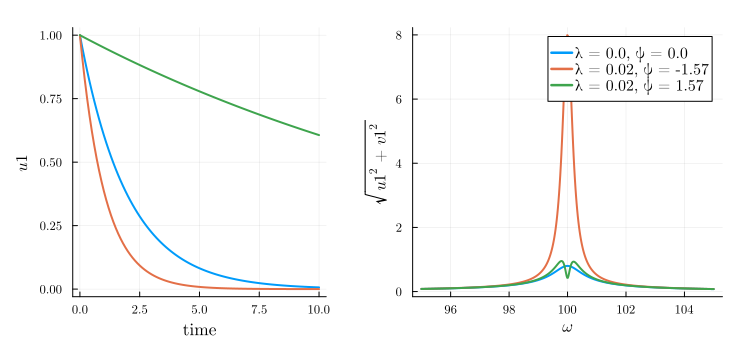

In [137]:
x0 = [1.0, 0.0]; tspan = (0.0, 10.0); Q = 100; ω0 = 100; λₜₕ = 2/Q

p1 = plot()
for (lambda, psi) = [(0.0*λₜₕ, 0.0), (0.9*λₜₕ, -π/2), (0.9*λₜₕ, π/2)]
    fixed = (ω => ω0, ω₀ => ω0, γ => ω0/Q, F => 0.00, α => 0.0, λ => lambda, η => 0.0, θ => 0.0, ψ => psi)
    ode_problem = ODEProblem(harmonic, fixed, x0 = x0, timespan = tspan)
    tr = solve(ode_problem, Tsit5(), saveat=0.1);
    plot!(tr, "u1", harmonic)
end


varied = ω => range(95, 105, 500)
p2 = plot(;legend = false)
for (i, (lambda, psi)) = pairs([(0.0*λₜₕ, 0.0), (0.9*λₜₕ, -π/2), (0.9*λₜₕ, π/2)])
    fixed = (ω₀ => omega0, γ => omega0/Q, F => 80.00, α => 0.0, λ => lambda, η => 0.0, θ => 0.0, ψ => psi)
    result = get_steady_states(harmonic, varied, fixed)
    label = "λ = $(round(lambda; digits=2)), ψ = $(round(psi; digits=2))"
    plot!(result, x="ω", y="sqrt(u1^2 + v1^2)", color=i, label=label, legend=:best)
end

l = @layout [a{0.45w} b]
plot(p1, p2, layout = l, legendfontsize = 10, size = plot_size, margin = margin)

Indeed, we can cool or amplify the resonant peak observed in the stable non-zero amplitude steady states created with only linear damping (small $\lambda$).

### Stable Parametron without driving
We need the nonlinear terms to stabilize the system. This can be done with the duffing $\alpha$ term, studied before, and the non-linear damping $\eta$:
$$
\ddot{x}(t)+\gamma\dot{x}(t)+\omega_0^2(1-\lambda\cos(2\omega t + \psi))x + \alpha x^3 +\eta x^2 \dot{x}=0
$$
Note that, neither linear ($\gamma$) nor nonlinear damping ($\eta$) is needed to stabilize the system. However, we will include it for completeness. Actually, one might also say, that the instability (i.e. the state of infinitely large amplitude) is just shifted to infinitely large detuning (of course other things of approximations probably break down earlier).

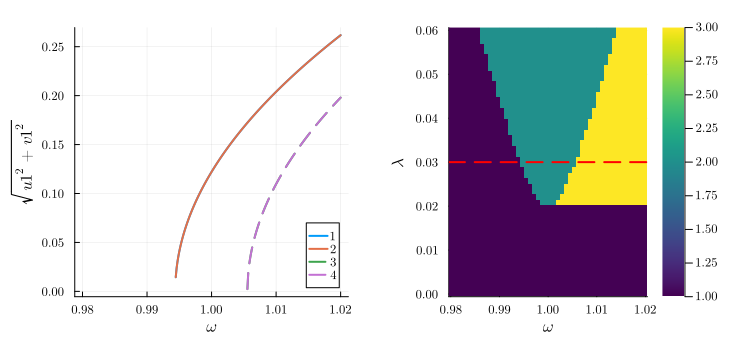

In [138]:
varied1 = ω => range(0.98, 1.02, 300)
fixed1 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, λ => 0.03, η => 0.0, θ => 0.0, ψ => 0.0)
result1 = get_steady_states(harmonic, varied1, fixed1; kwargs...)
plot1 = plot(result1, "sqrt(u1^2+v1^2)", legend=:best)

fixed2 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, η => 0.0, θ => 0.0, ψ => 0.0)
varied2 = (ω => range(0.98, 1.02, 50), λ => range(1e-6, 0.06, 50))
result_2D = get_steady_states(harmonic, varied2, fixed2; random_warmup=false, HB_settings...);
plot2 = plot_phase_diagram(result_2D, class="stable")
hline!([fixed1[λ]], style = :dash, color = :red, legend = false)

plot(plot1, plot2, size = plot_size, margin = margin)

The presence of a nonlinear force $β_3$ leads to an effective detuning of the resonance frequency as a function of the amplitude. This detuning causes a decrease of the pumping efficiency and a saturation of the growth. We observe that for small detuning the zero amplitude stable state is unstable, hence, not observed in nature. Nevertheless, in the region, there are two non-zero stable steady states degenerate in amplitude. These states we call the *phase states*. When increasing the driving frequency $\omega$ the phase states keep existing, however, the zero amplitude state becomes stable again.

![](./WwRVTtu.png)

The region where the zero amplitude steady states is unstable is bounded by
$$\omega_{\pm}^2=\omega_0^2\left(1 \pm \sqrt{\frac{\lambda^2}{4}-\frac{1}{Q^2}}\right).$$
Note, that $\alpha$ and $\eta$ have no influence on the boundaries as x is small at A ($\omega_-$) and B ($\omega_+$).

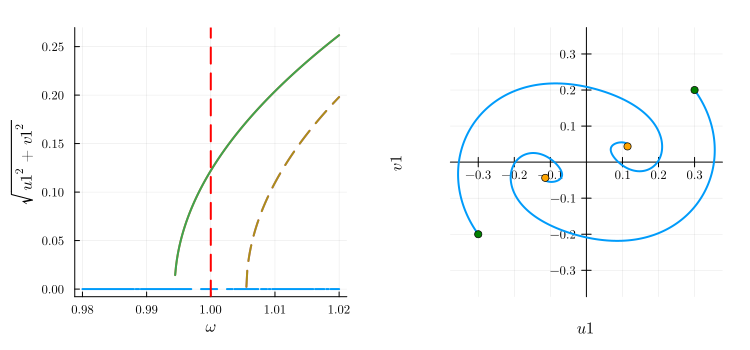

In [139]:
varied = ω => range(0.98, 1.02, 300)
fixed = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, λ => 0.03, η => 0.0, θ => 0.0, ψ => 0.0)
result = get_steady_states(harmonic, varied, fixed; random_warmup=true, HB_settings...)
plot_sweep = plot(result, "sqrt(u1^2+v1^2)")

x0_1 = [0.3, 0.2]; x0_2 = [-0.3, -0.2]; tspan = (0.0, 2000.0)
fixed_tr = Dict(ω => 1.0, ω₀ => 1.0, γ => 0.01, F => 0.00, α => 1.0, λ => 0.03, η => 0.0, θ => 0.0, ψ => 0.0)

ode_problem1 = ODEProblem(harmonic, fixed_tr, x0 = x0_1, timespan = tspan)
ode_problem2 = ODEProblem(harmonic, fixed_tr, x0 = x0_2, timespan = tspan)
tr1 = solve(ode_problem1, Tsit5(), saveat=0.1);
tr2 = solve(ode_problem2, Tsit5(), saveat=0.1);

plot_tr = plot(;framestyle = :origin, aspect_ratio=1, legend=false, lims = :symmetric)
plot!(tr1, ["u1", "v1"], harmonic, color = 1)
plot!([x0_1[1]],[x0_1[2]], markers=:true, line=false, color=:green)
plot!([tr1.u[end][1]],[tr1.u[end][2]], markers=:true, line=false, color=:orange)
plot!(tr2, ["u1", "v1"], harmonic, color = 1)
plot!([x0_2[1]],[x0_2[2]], markers=:true, line=false, color=:green)
plot!([tr2.u[end][1]],[tr2.u[end][2]], markers=:true, line=false, color=:orange)

vline!(plot_sweep, [fixed_tr[ω]], style = :dash, color = :red, legend = false)
plot(plot_sweep, plot_tr, size = plot_size, margin = margin)

Ending up in one of the two phase states purely depends on the initial condition (I.C.).

Note that the period of the response is twice as large as the drive. This is called *periodicity doubling* (time translation symmetry breaking).

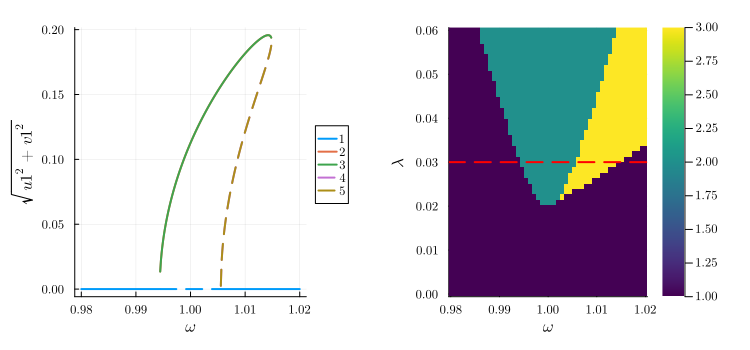

In [146]:
varied1 = ω => range(0.98, 1.02, 300)
fixed1 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, λ => 0.03, η => 0.5, θ => 0.0, ψ => 0.0)
result1 = get_steady_states(harmonic, varied1, fixed1; random_warmup=true, HB_settings...)
plot1 = plot(result1, "sqrt(u1^2+v1^2)")

fixed2 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, η => 0.5, θ => 0.0, ψ => 0.0)
varied2 = (ω => range(0.98, 1.02, 50), λ => range(1e-6, 0.06, 50))
result_2D = get_steady_states(harmonic, varied2, fixed2; random_warmup=true, HB_settings...);
plot2 = plot_phase_diagram(result_2D, class="stable")
hline!([fixed1[λ]], style = :dash, color = :red, legend = false)

plot(plot1, plot2, size = plot_size, margin = margin)

When adding nonlinear damping $\eta$ the phase states disappear for a large detuning.

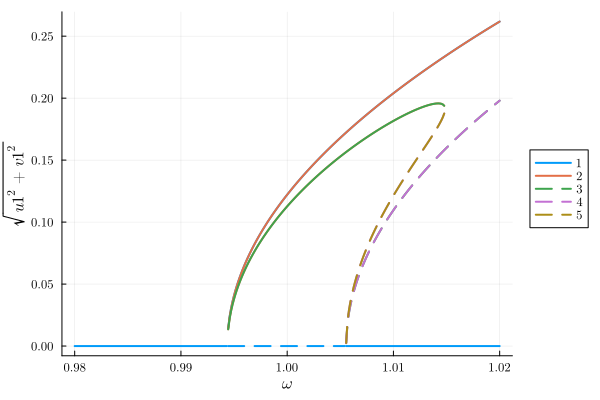

In [141]:
varied = ω => range(0.98, 1.02, 300)
fixed = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, λ => 0.03, η => 0.0, θ => 0.0, ψ => 0.0)
result1 = get_steady_states(harmonic, varied, fixed; random_warmup=true, HB_settings...)

varied = ω => range(0.98, 1.02, 300)
fixed = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, λ => 0.03, η => 0.5, θ => 0.0, ψ => 0.0)
result2 = get_steady_states(harmonic, varied, fixed; random_warmup=true, HB_settings...)

plot(result1, "sqrt(u1^2+v1^2)")
plot!(result2, "sqrt(u1^2+v1^2)")

### Driven Symmetry breaking in a Paramatron
$$\ddot{x}(t)+\gamma\dot{x}(t)+\omega_0^2(1-\lambda\cos(2\omega t + \psi))x + \alpha x^3 +\eta x^2 \dot{x}=F\cos(\omega t + \theta)$$

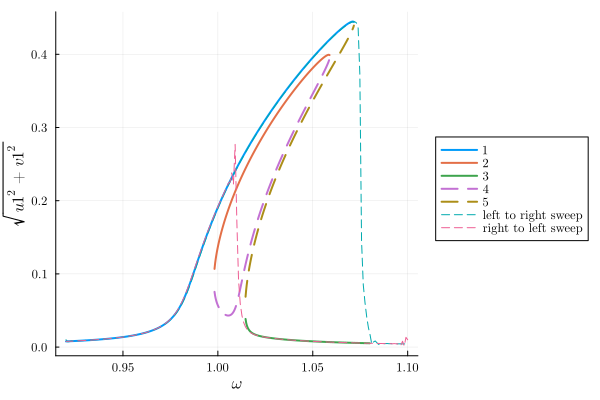

In [142]:
fixed = (ω₀ => 1.0, γ => 0.01, λ => 0.05, F => 0.001,  α => 1.0,  η => 0.3, θ => 0, ψ => 0)
varied = ω => range(0.92, 1.08, 500)
result = get_steady_states(harmonic, varied, fixed)
p = plot(result, x="ω", y="sqrt(u1^2 + v1^2)")

timespan = (0.0, 2e4)

 # linearly interpolate between two values at two times
right_sweep = ParameterSweep(ω => (0.92, 1.1), timespan)
ode_problem_right = ODEProblem(harmonic, fixed, sweep=right_sweep, x0=[0.01;0.0], timespan=timespan)

left_sweep = ParameterSweep(ω => (1.1, 0.92), timespan)
ode_problem_left =  ODEProblem(harmonic, fixed, sweep=left_sweep, x0=[0.01;0.0], timespan=timespan)

sol_right = solve(ode_problem_right, Tsit5(), saveat = 100);
amplitude_right = sqrt.(sol_right[1,:].^2 + sol_right[2,:].^2)
sol_left  = solve(ode_problem_left, Tsit5(), saveat = 100);
amplitude_left = sqrt.(sol_left[1,:].^2 + sol_left[2,:].^2)

plot!(right_sweep[ω].(sol_right.t), amplitude_right, style=:dash, label="left to right sweep", linewidth=1)
plot!(left_sweep[ω].(sol_left.t), amplitude_left, style=:dash, label="right to left sweep", linewidth=1)

$\textcolor{red}{\text{Help:}}$ Why is does the sweep from right to left hop to the highest amplitude branch? In Oded's book it is stated that it should hop to the lowest amplitude branch.

When we drive the parametron with an extra external drive $F$ we can break the amplitude degeneracy of the phase states. This is called ***parametric symmetry breaking***.

### Spaghetti plots

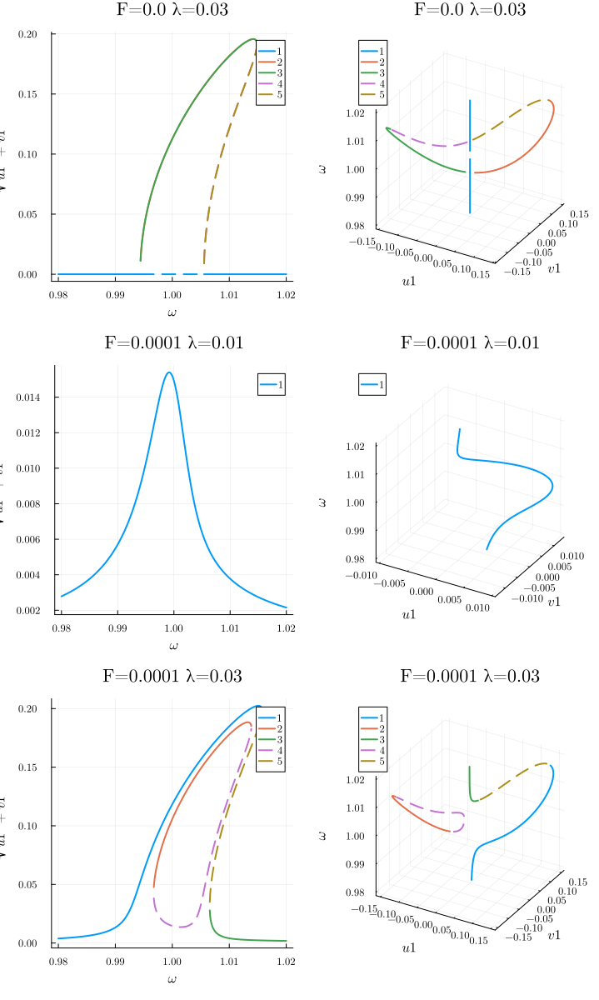

In [143]:
varied_sweep = ω => range(0.98, 1.02, 600)
fixed_sweep1 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0, α => 1.0, λ => 0.03, η => 0.5, θ => 0.0, ψ => 0.0)
fixed_sweep2 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0001, α => 1.0, λ => 0.01, η => 0.5, θ => 0.0, ψ => 0.0)
fixed_sweep3 = Dict(ω₀ => 1.0, γ => 0.01, F => 0.0001, α => 1.0, λ => 0.03, η => 0.5, θ => 0.0, ψ => 0.0)

fixed_sweep = [fixed_sweep1, fixed_sweep2, fixed_sweep3]
result_sweep = broadcast(
    p -> get_steady_states(harmonic, varied_sweep, p; HB_settings...),
    fixed_sweep
    )
plots = broadcast(
    res -> plot(plot(res, x="ω", y="sqrt(u1^2 + v1^2)"), plot_spaghetti(res, x="u1", y="v1", z="ω"),
    title =  savename(res.fixed_parameters, connector = " ", accesses = (F, λ)), legend=:best),
    result_sweep
    )
plot(plots..., size = (720, 1200), layout = (3,1))